<a href="https://colab.research.google.com/github/OnuJane/BlogApp/blob/main/Copy_of_CO2_EOR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## EDA for CO-EOR dataset

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
import io

# Upload file
uploaded = files.upload()  # This will prompt you to select the CSV file from your computer

# Replace 'CO-EOR.csv' with your actual uploaded file name
df = pd.read_csv(io.BytesIO(uploaded['CO2 Dataset.csv']))

# Keep only relevant columns (A–K)
df = df.iloc[:, 0:11]

# Separate inputs and targets
input_vars = df.columns[0:9]
target_vars = df.columns[9:11]

print("Input Variables:", list(input_vars))
print("Target Variables:", list(target_vars))


Saving CO2 Dataset.csv to CO2 Dataset.csv
Input Variables: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw']
Target Variables: ['CO2 storage (ton)', 'Cummulative oil production (bbl)']


## 1. Basic Info

In [ ]:
print("\n--- Dataset Info ---")
print(df.info())
print("\n--- Summary Statistics ---")
print(df.describe())


--- Dataset Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21193 entries, 0 to 21192
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BHP (psi)                         21193 non-null  float64
 1   AREA (ft2)                        21193 non-null  float64
 2   INJRATE (ft3/day)                 21193 non-null  float64
 3   POROSITY                          21193 non-null  float64
 4   PERM (md)                         21193 non-null  float64
 5   THICKNESS (ft)                    21193 non-null  float64
 6   DEPTH (ft)                        21193 non-null  float64
 7   Sorg                              21193 non-null  float64
 8   Sorw                              21193 non-null  float64
 9   CO2 storage (ton)                 21193 non-null  float64
 10  Cummulative oil production (bbl)  21193 non-null  float64
dtypes: float64(11)
memory usage: 1.8 MB
None

---

## 2. Missing Values

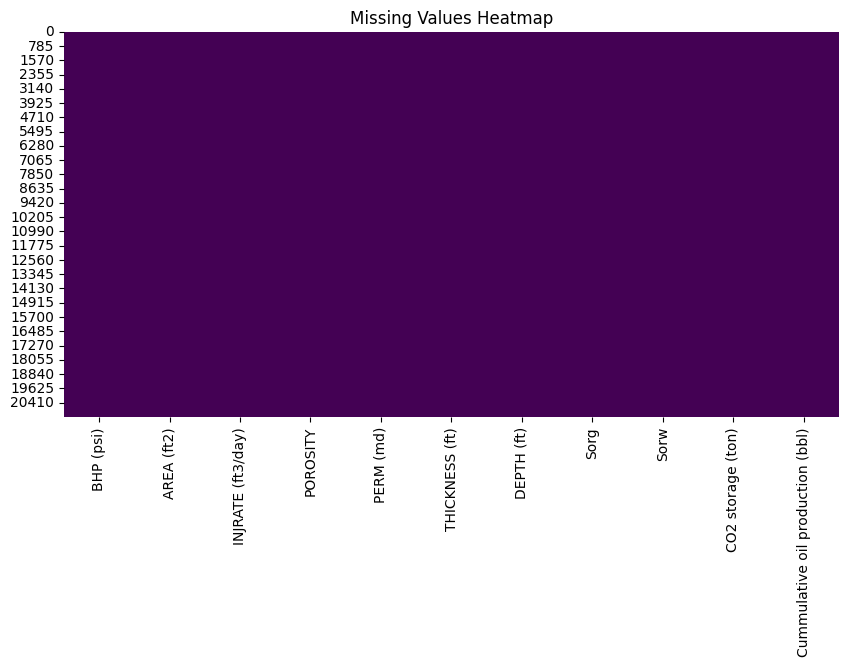

In [ ]:
plt.figure(figsize=(10, 5))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

## 3. Distribution of Input Variables


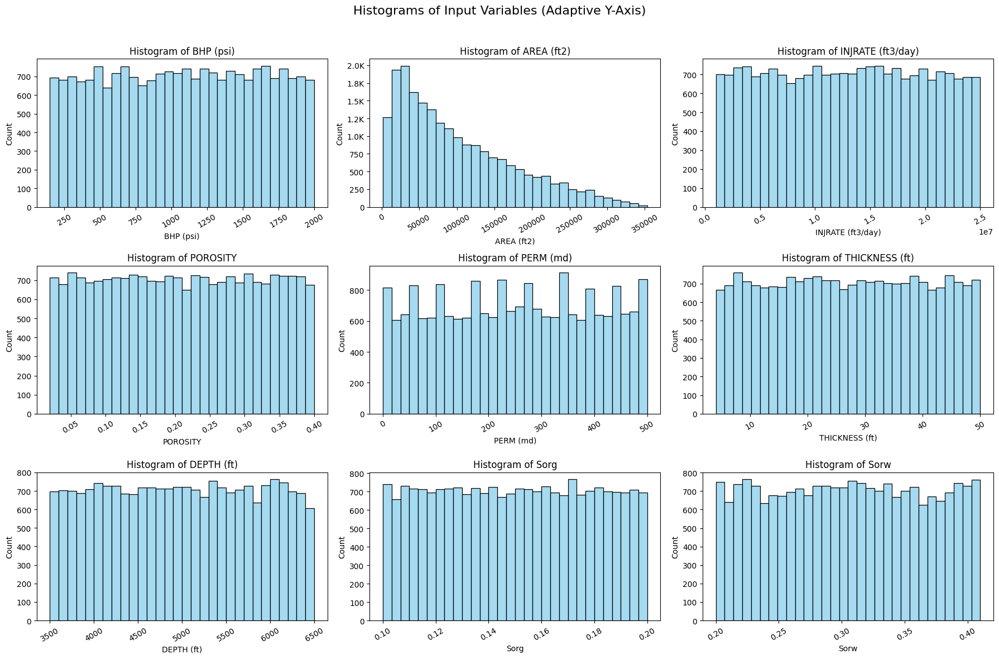

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Function to format large numbers on y-axis only when needed
def smart_formatter(x, pos):
    if x >= 1_000_000:
        return f'{x/1_000_000:.1f}M'
    elif x >= 1_000:
        return f'{x/1_000:.1f}K'
    else:
        return int(x)

# Plot histograms with adaptive y-axis formatting
plt.figure(figsize=(18, 12))
for i, col in enumerate(input_vars, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], bins=30, kde=False, color='skyblue', edgecolor='black')
    plt.title(f"Histogram of {col}", fontsize=12)

    # Apply smart formatter
    plt.gca().yaxis.set_major_formatter(FuncFormatter(smart_formatter))
    plt.xticks(rotation=30)

plt.suptitle("Histograms of Input Variables (Adaptive Y-Axis)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## 4. Correlation Heatmap


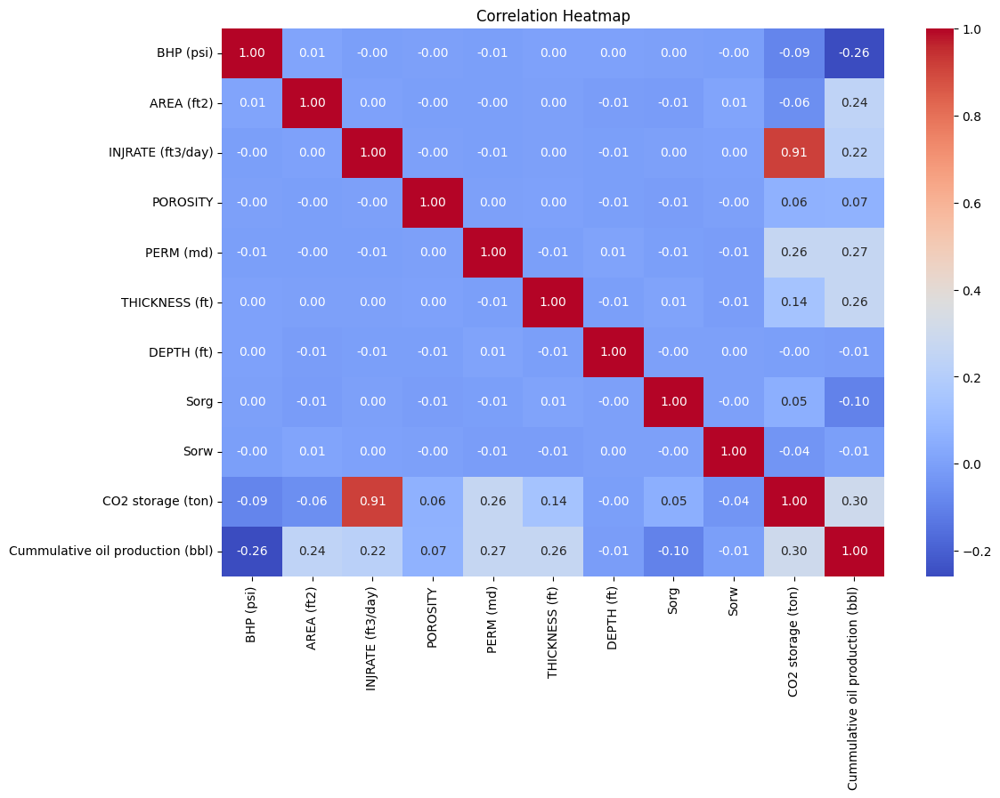

In [ ]:

plt.figure(figsize=(12, 8))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

## 5. Pairplot (Inputs vs Targets)

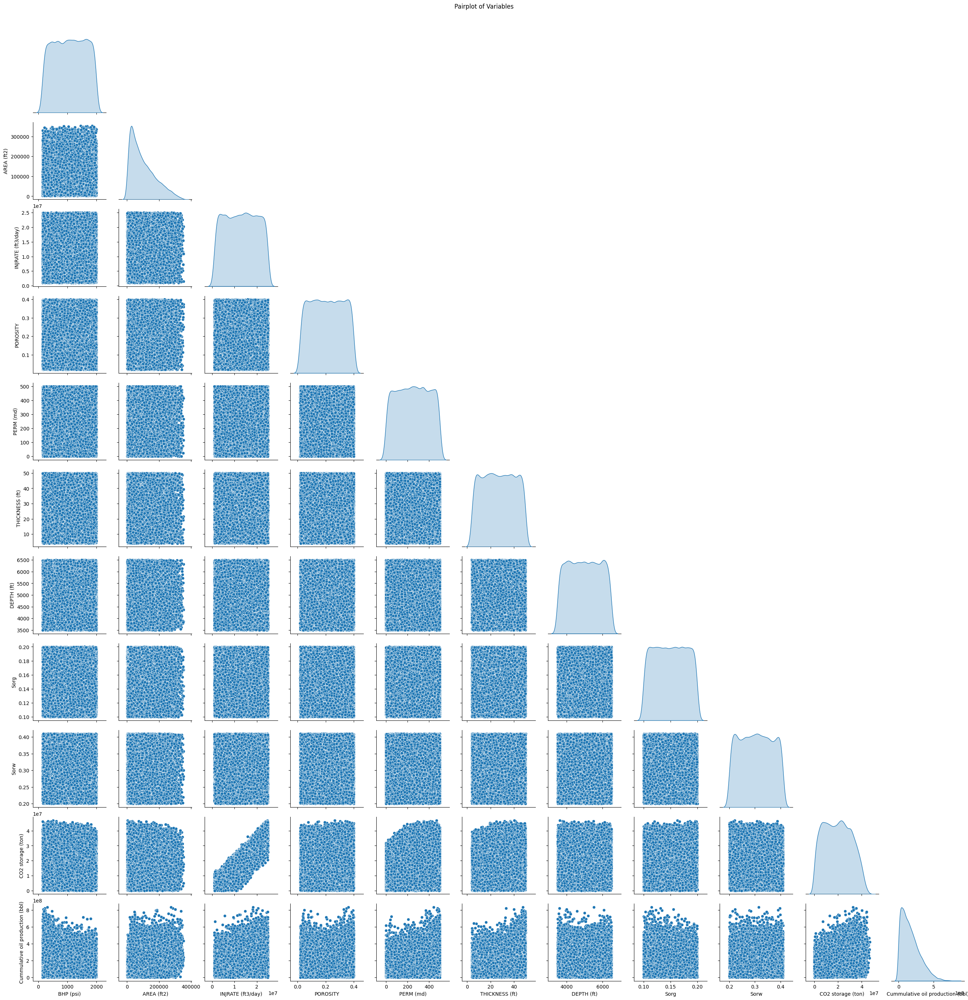

In [ ]:
sns.pairplot(df[input_vars.tolist() + target_vars.tolist()], diag_kind='kde', corner=True)
plt.suptitle("Pairplot of Variables", y=1.02)
plt.show()

## 6. Boxplots to detect Outliers

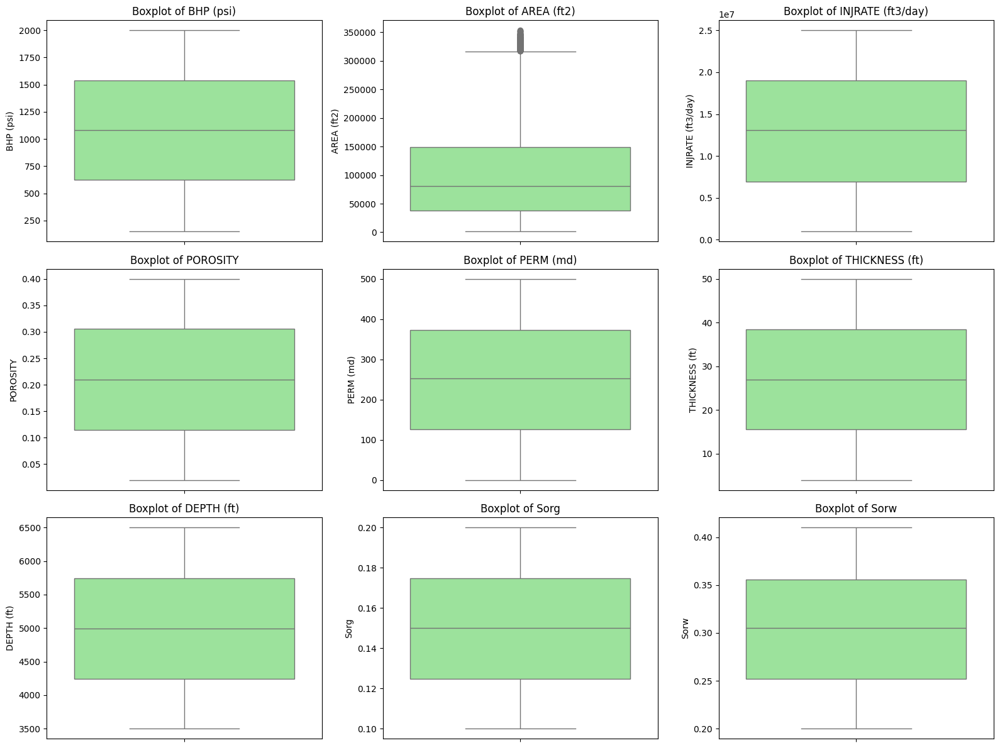

In [ ]:
plt.figure(figsize=(16, 12))
for i, col in enumerate(input_vars, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[col], color='lightgreen')
    plt.title(f"Boxplot of {col}")
plt.tight_layout()
plt.show()

## 7. Relationship between Inputs & Targets

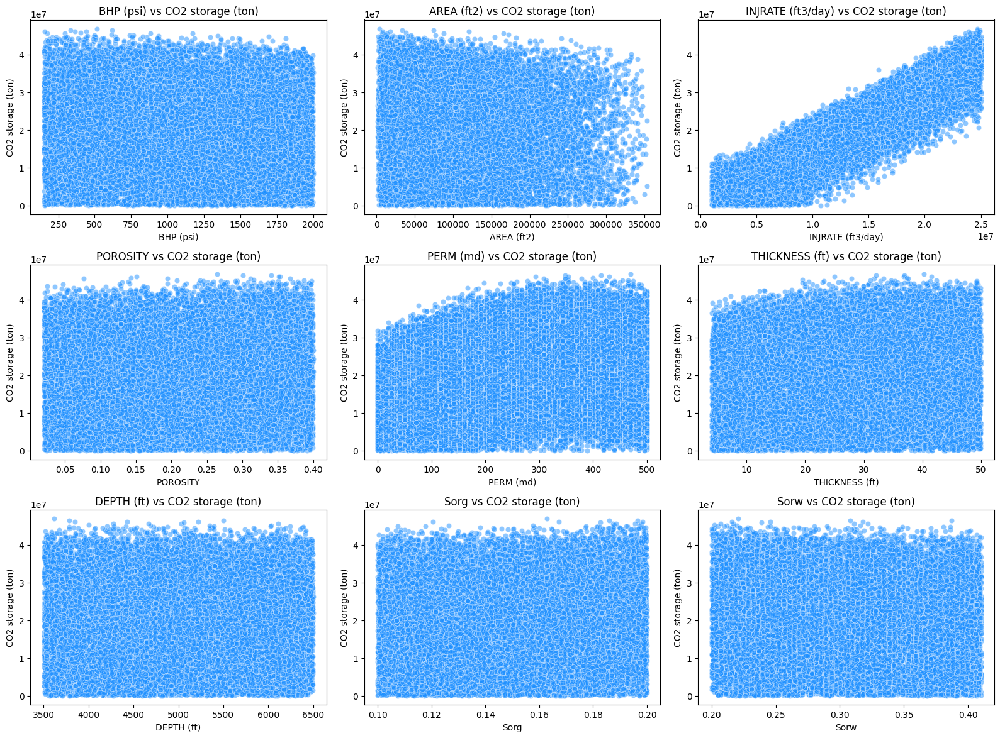

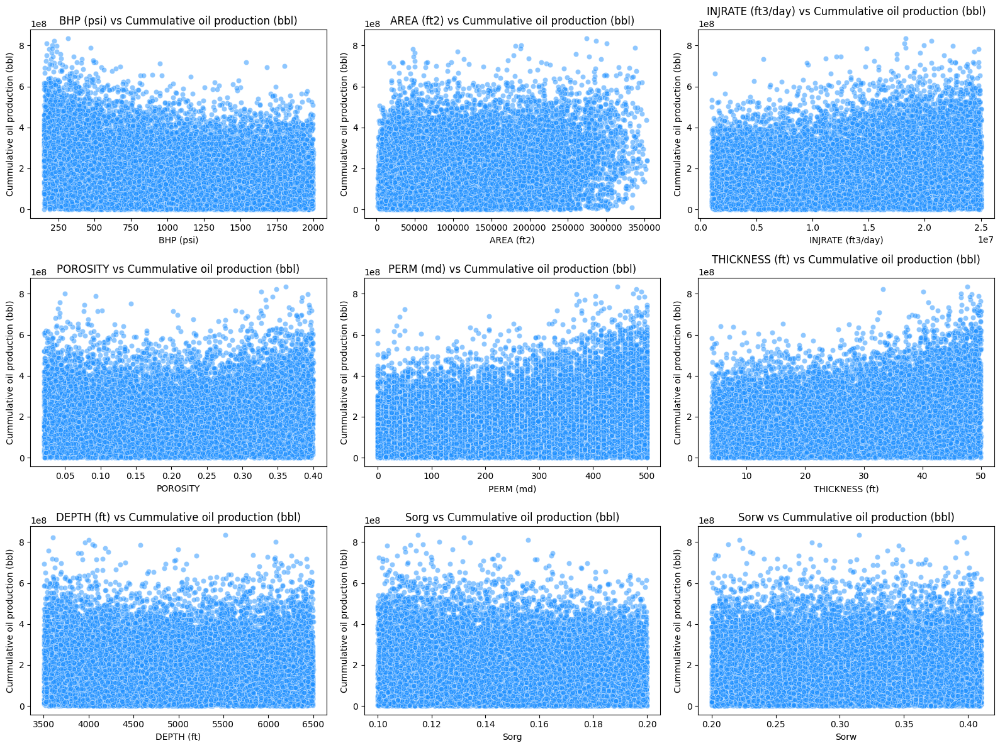

In [ ]:

# --------------------
for target in target_vars:
    plt.figure(figsize=(16, 12))
    for i, col in enumerate(input_vars, 1):
        plt.subplot(3, 3, i)
        sns.scatterplot(x=df[col], y=df[target], alpha=0.5, color='dodgerblue')
        plt.title(f"{col} vs {target}")
    plt.tight_layout()
    plt.show()


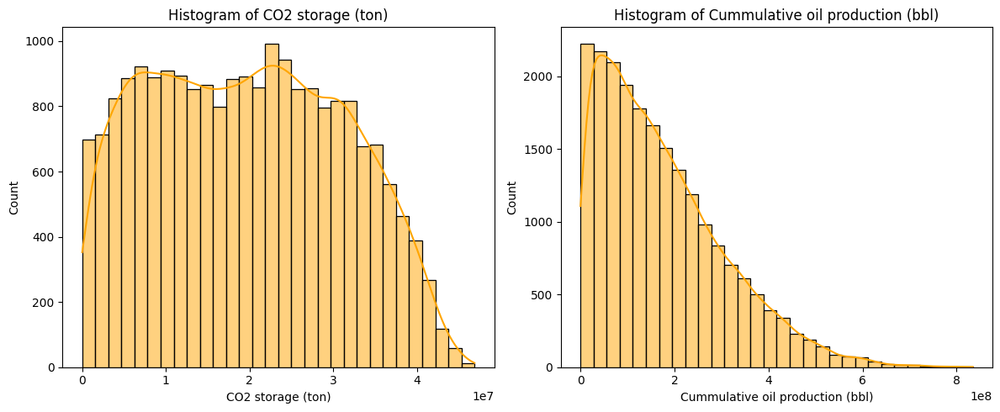

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
file_path = "CO-EOR .csv"
df = pd.read_csv(file_path)

# Target variables: columns J (index 9) and K (index 10)
target_vars = df.columns[9:11]

# Plot histograms
plt.figure(figsize=(12, 5))

for i, col in enumerate(target_vars, 1):
    plt.subplot(1, 2, i)
    sns.histplot(df[col], bins=30, kde=True, color='orange', edgecolor='black')
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()


## Print actual skew values and see what the detector saw

In [ ]:
# What is the raw skew of each input feature?
X_raw = df.iloc[:, 0:9]
print("Skewness of inputs:\n", X_raw.skew().sort_values(ascending=False))


Skewness of inputs:
 AREA (ft2)           0.882754
Sorw                 0.010948
DEPTH (ft)           0.001643
Sorg                 0.001411
THICKNESS (ft)       0.001311
POROSITY             0.001065
INJRATE (ft3/day)   -0.002640
PERM (md)           -0.008582
BHP (psi)           -0.017053
dtype: float64


##  Transforming Skewed Features and target variable

Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']

Evaluating with: forced log1p(AREA) + RobustScaler + RidgeCV
CO2 storage (ton): 5-fold CV  R²=0.949  RMSE=2554207.328
Cumulative oil (bbl) [log-target]: 5-fold CV  R²=0.268  RMSE=113627647.235

Pipeline logged columns: ['AREA (ft2)']


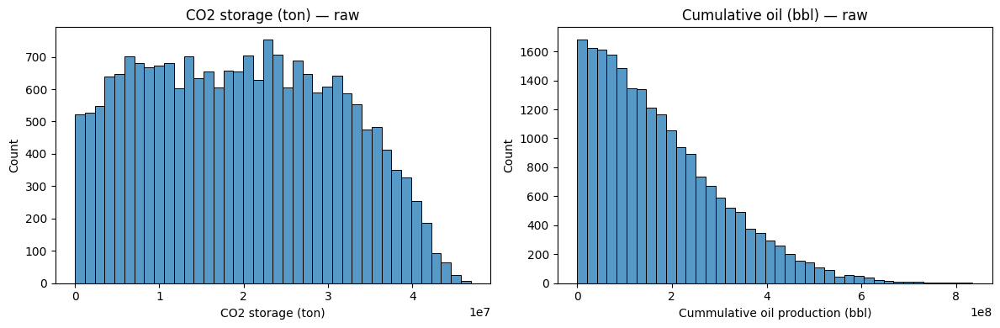


Skew (AREA)  raw=0.88 | log1p=-0.70 | preprocessed=-0.70


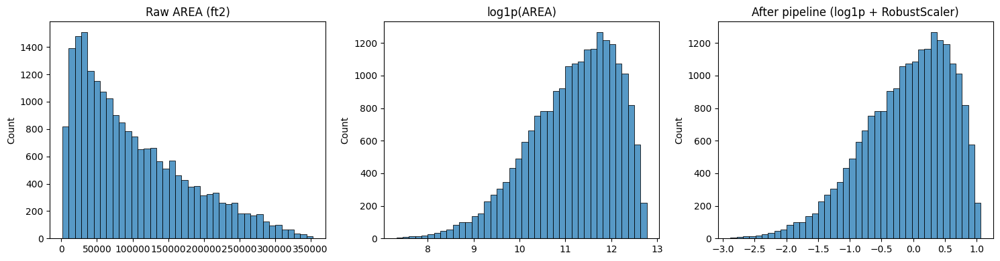

In [ ]:
# ======================== CO-EOR: End-to-end, fixed pipeline ========================
import warnings, numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import RidgeCV, ElasticNetCV  # swap if you like
from sklearn.model_selection import cross_val_score

warnings.filterwarnings("ignore")

# ---------------------- 0) Load data (A–K) ----------------------
df = pd.read_csv("CO-EOR .csv").iloc[:, 0:11]

# Inputs A–I, Targets J & K
X = df.iloc[:, 0:9].copy()
y_co2 = df.iloc[:, 9].copy()   # CO2 storage (ton)
y_oil = df.iloc[:,10].copy()   # Cumulative oil production (bbl)

print("Columns:", df.columns.tolist())  # sanity check

# ---------------------- 1) Custom transformer: log1p skewed features ----------------------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    """
    Log1p-transform columns with |skew| > skew_threshold (detected on fit)
    and/or any columns listed in `include`. Then return numpy array for sklearn.
    """
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include if include is not None else []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        skew = Xdf.skew(numeric_only=True)
        auto = skew[skew.abs() > self.skew_threshold].index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

# ---------------------- 2) Feature preprocessing ----------------------
# Force AREA to be logged; also auto‑log any other skewed cols (|skew|>1)
feature_preprocess = Pipeline(steps=[
    ("log_skew", SkewLog1pTransformer(skew_threshold=1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())
])

preprocessor = ColumnTransformer(
    transformers=[("num", feature_preprocess, X.columns)],
    remainder="drop"
)

# ---------------------- 3) Models ----------------------
# Regularized linear model; Ridge is robust with collinearity.
ridge = RidgeCV(alphas=np.logspace(-3, 3, 25), cv=5)

# Elastic Net option (uncomment to try)
# enet = ElasticNetCV(l1_ratio=[0.1,0.5,0.9], alphas=np.logspace(-3,1,25), cv=5, max_iter=5000)

# Pipelines (keep CO2 raw target by default; oil in log-space)
use_log_target_co2 = False

co2_core = Pipeline([("prep", preprocessor), ("reg", ridge)])
co2_model = (
    TransformedTargetRegressor(regressor=co2_core, func=np.log1p, inverse_func=np.expm1)
    if use_log_target_co2 else co2_core
)

oil_model = TransformedTargetRegressor(
    regressor=Pipeline([("prep", preprocessor), ("reg", ridge)]),
    func=np.log1p, inverse_func=np.expm1
)

# ---------------------- 4) CV evaluation ----------------------
def cv_report(model, X, y, name):
    r2 = cross_val_score(model, X, y, cv=5, scoring="r2").mean()
    rmse = (-cross_val_score(model, X, y, cv=5, scoring="neg_root_mean_squared_error")).mean()
    print(f"{name}: 5-fold CV  R²={r2:.3f}  RMSE={rmse:.3f}")

print("\nEvaluating with: forced log1p(AREA) + RobustScaler + RidgeCV")
cv_report(co2_model, X, y_co2, "CO2 storage (ton)")
cv_report(oil_model,  X, y_oil, "Cumulative oil (bbl) [log-target]")

# ---------------------- 5) Fit and VERIFY which columns were logged ----------------------
co2_model.fit(X, y_co2)
inner = co2_model.regressor if isinstance(co2_model, TransformedTargetRegressor) else co2_model
log_step = inner.named_steps["prep"].named_transformers_["num"].named_steps["log_skew"]
print("\nPipeline logged columns:", log_step.to_log_)

# ---------------------- 6) Visual checks ----------------------
# A) Targets: distributions (to confirm why log-target helps oil)
fig, ax = plt.subplots(1,2, figsize=(12,4))
sns.histplot(y_co2, bins=40, ax=ax[0], edgecolor="black")
ax[0].set_title("CO2 storage (ton) — raw")
sns.histplot(y_oil, bins=40, ax=ax[1], edgecolor="black")
ax[1].set_title("Cumulative oil (bbl) — raw")
plt.tight_layout(); plt.show()

# B) AREA: raw vs log1p vs preprocessed (after full pipeline)
col = "AREA (ft2)"
raw = X[col].values
logged = np.log1p(np.clip(raw, 0, None))

Xt = inner.named_steps["prep"].transform(X)         # transformed features
Xt = pd.DataFrame(Xt, columns=X.columns)            # preserve names
prep = Xt[col].values

print(
    f"\nSkew (AREA)  raw={pd.Series(raw).skew():.2f} | "
    f"log1p={pd.Series(logged).skew():.2f} | "
    f"preprocessed={pd.Series(prep).skew():.2f}"
)

plt.figure(figsize=(15,4))
plt.subplot(1,3,1)
sns.histplot(raw, bins=40, edgecolor="black"); plt.title("Raw AREA (ft2)")
plt.subplot(1,3,2)
sns.histplot(logged, bins=40, edgecolor="black"); plt.title("log1p(AREA)")
plt.subplot(1,3,3)
sns.histplot(prep, bins=40, edgecolor="black"); plt.title("After pipeline (log1p + RobustScaler)")
plt.tight_layout(); plt.show()


# STEP 1 BASELINE: RIDGE REGRESSION (2 targets)

In [ ]:

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.metrics import (
    r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
)
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# -----------------------------
# 0) Load data (A–K)
# -----------------------------
file_path = "CO-EOR .csv"   # note the space in your filename
df = pd.read_csv(file_path).iloc[:, 0:11]

# Inputs (A–I) and Targets (J & K)
X = df.iloc[:, 0:9].copy()
y_co2 = df.iloc[:, 9].copy()   # J: CO2 storage (ton)
y_oil = df.iloc[:,10].copy()   # K: Cumulative oil production (bbl)

print("Columns:", df.columns.tolist())

# -----------------------------
# 1) Custom transformer: log1p for skewed features
#    (Force log1p on AREA's long tail; RobustScaler is harmless for trees)
# -----------------------------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include if include is not None else []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        skew = Xdf.skew(numeric_only=True)
        auto = skew[skew.abs() > self.skew_threshold].index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline(steps=[
    ("log_skew", SkewLog1pTransformer(skew_threshold=1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())  # trees don't need scaling, but we keep it for consistency
])

preprocessor = ColumnTransformer(
    transformers=[("num", feature_preprocess, X.columns)],
    remainder="drop"
)

# -----------------------------
# 2) Train/Test split (shared for both targets)
# -----------------------------
X_train, X_test, y_co2_train, y_co2_test, y_oil_train, y_oil_test = train_test_split(
    X, y_co2, y_oil, test_size=0.2, random_state=RANDOM_STATE
)

# -----------------------------
# 3) Random Forest + tuning (train set only)
# -----------------------------
rf_base = RandomForestRegressor(
    n_estimators=500,           # solid default
    random_state=RANDOM_STATE,
    n_jobs=-1,
    bootstrap=True
)

# Reasonable hyperparameter search space
param_dist = {
    "reg__n_estimators": [400, 600, 800],
    "reg__max_depth": [None, 10, 20, 30, 40],
    "reg__min_samples_split": [2, 5, 10],
    "reg__min_samples_leaf": [1, 2, 4],
    "reg__max_features": ["auto", "sqrt", 0.6, 0.8]
}

# Pipelines
co2_pipe = Pipeline([
    ("prep", preprocessor),
    ("reg", rf_base)
])

oil_inner_rf = Pipeline([
    ("prep", preprocessor),
    ("reg", rf_base)
])

# Tune on TRAIN ONLY (5-fold CV). Separate tuners per target.
co2_search = RandomizedSearchCV(
    estimator=co2_pipe,
    param_distributions=param_dist,
    n_iter=20,
    cv=5,
    scoring="r2",
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=0
)

oil_search = RandomizedSearchCV(
    estimator=oil_inner_rf,
    param_distributions=param_dist,
    n_iter=20,
    cv=5,
    scoring="r2",
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=0
)

# Oil: wrap tuned pipeline in TransformedTargetRegressor (log target)
oil_pipe = TransformedTargetRegressor(
    regressor=oil_search,
    func=np.log1p, inverse_func=np.expm1
)

# -----------------------------
# 4) Fit models
# -----------------------------
co2_search.fit(X_train, y_co2_train)
oil_pipe.fit(X_train, y_oil_train)

print("Best RF params (CO2):", co2_search.best_params_)
print("Best RF params (Oil):", oil_search.best_params_ if hasattr(oil_search, "best_params_") else "n/a (inside TTR)")

# -----------------------------
# 5) Evaluate (Test set)
# -----------------------------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float).ravel()
    y_pred = np.asarray(y_pred, dtype=float).ravel()
    r2  = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))  # compat with older sklearn
    mape = mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100.0
    return {"R2": r2, "MAE": mae, "RMSE": rmse, "MAPE_%": mape}

# Predictions
y_co2_pred = co2_search.predict(X_test)
y_oil_pred = oil_pipe.predict(X_test)

# Metrics table
co2_metrics = metrics_report(y_co2_test, y_co2_pred)
oil_metrics = metrics_report(y_oil_test, y_oil_pred)

results = (
    pd.DataFrame([co2_metrics, oil_metrics], index=["CO2 storage (ton)", "Cumulative oil (bbl)"])
      .loc[:, ["R2", "MAE", "RMSE", "MAPE_%"]]
)
print("\n=== Test Metrics (Random Forest, tuned) ===")
print(results)

# -----------------------------
# 6) Cross-validated training score (sanity check, TRAIN only)
#     Use best estimator for CO2; for Oil, use the TTR wrapper directly.
# -----------------------------
def cv_summary(pipe, X_tr, y_tr, name):
    r2 = cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="r2", n_jobs=-1).mean()
    rmse = (-cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
    print(f"{name}: 5-fold CV on TRAIN -> R²={r2:.3f}, RMSE={rmse:.3f}")

cv_summary(co2_search.best_estimator_, X_train, y_co2_train, "CO2 (RF tuned)")
cv_summary(oil_pipe, X_train, y_oil_train, "Oil  (RF tuned, log-target)")

# -----------------------------
# 7) Residual diagnostics (Test)
# -----------------------------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0])
    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted")
    ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")

    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1])
    ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_co2_test.values, y_co2_pred, "CO2 storage (ton) — RF")
residual_plots(y_oil_test.values, y_oil_pred, "Cumulative oil (bbl) — RF")

# -----------------------------
# 8) Feature importance
#     (a) Built-in RF Gini importance
#     (b) Permutation importance on TEST for reliability
# -----------------------------
def plot_feature_importance(importances, feature_names, title, top_n=12):
    imp = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8,4))
    imp.iloc[::-1].plot(kind="barh")
    plt.title(title); plt.xlabel("Importance"); plt.tight_layout(); plt.show()
    return imp

# (a) Built-in importance (CO2)
rf_best_co2 = co2_search.best_estimator_.named_steps["reg"]
plot_feature_importance(rf_best_co2.feature_importances_, X.columns, "RF Feature Importance (CO2)")

# (b) Permutation importance on TEST (CO2)
perm_co2 = permutation_importance(co2_search.best_estimator_, X_test, y_co2_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm_co2.importances_mean, X.columns, "Permutation Importance on TEST (CO2)")

# For Oil: need the tuned inner estimator (inside TTR -> RandomizedSearchCV -> Pipeline)
rf_best_oil = oil_search.best_estimator_.named_steps["reg"]
plot_feature_importance(rf_best_oil.feature_importances_, X.columns, "RF Feature Importance (Oil)")

perm_oil = permutation_importance(oil_pipe, X_test, y_oil_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm_oil.importances_mean, X.columns, "Permutation Importance on TEST (Oil)")


Saving CO2 Dataset.csv to CO2 Dataset (1).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Input columns log1p-transformed: ['AREA (ft2)']

=== Test Metrics (CO2 storage) ===
         R2           MAE          RMSE     MAPE_%
0  0.948428  1.962185e+06  2.563213e+06  33.142619
5-fold CV on TRAIN -> R²=0.949, RMSE=2552314.194


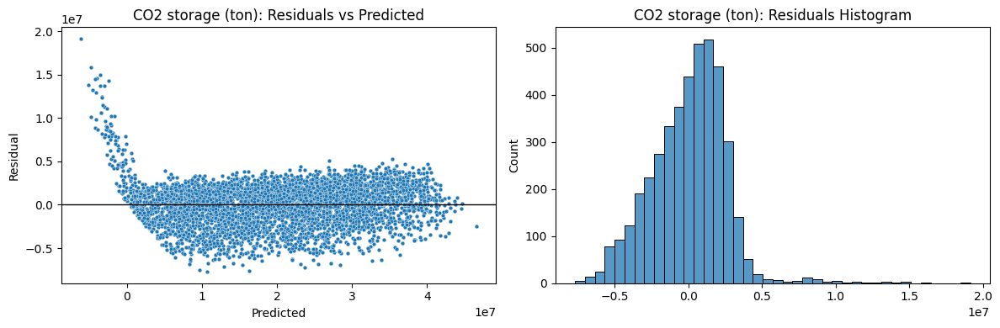


Top coefficients (CO2 model):
INJRATE (ft3/day)    1.800510e+07
PERM (md)            5.239648e+06
THICKNESS (ft)       2.738678e+06
BHP (psi)           -1.665651e+06
POROSITY             1.277138e+06
AREA (ft2)          -9.983390e+05
Sorg                 9.686833e+05
Sorw                -7.307974e+05
DEPTH (ft)           1.776251e+04
dtype: float64


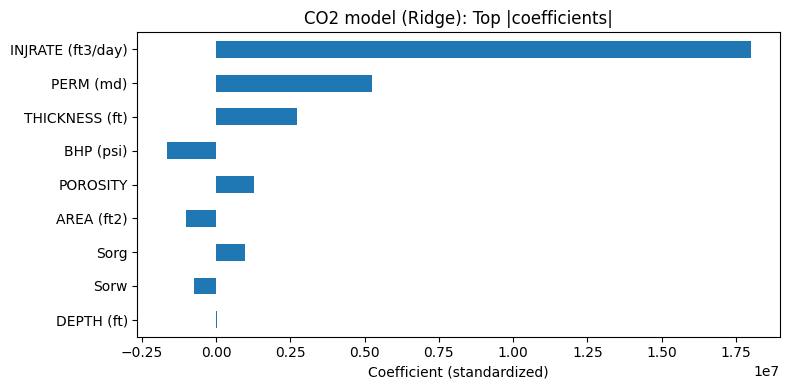

In [ ]:
# =========================================
# STEP 1 BASELINE: RIDGE REGRESSION (2 targets)
# =========================================
# === CO2 STORAGE ONLY ===
import warnings; warnings.filterwarnings("ignore")

import io, numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from google.colab import files

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# ---------- 0) Upload & load (use first 11 columns: A–K) ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(io.BytesIO(uploaded[fname])).iloc[:, 0:11]

# Inputs (A–I) and Target (J)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 9].copy()  # CO2 storage (ton)

print("Columns:", df.columns.tolist())

# ---------- 1) Custom skew transformer ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include if include is not None else []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        skew = Xdf.skew(numeric_only=True)
        auto = skew[skew.abs() > self.skew_threshold].index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

# Preprocessing: log1p for skew (force AREA) + RobustScaler
feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(skew_threshold=1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- 2) Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ---------- 3) Model ----------
alphas = np.logspace(-3, 3, 25)
ridge = RidgeCV(alphas=alphas, cv=5)
pipe = Pipeline([("prep", preprocessor), ("reg", ridge)])

# ---------- 4) Fit ----------
pipe.fit(X_train, y_train)
log_step = pipe.named_steps["prep"].named_transformers_["num"].named_steps["log_skew"]
print("Input columns log1p-transformed:", log_step.to_log_)

# ---------- 5) Evaluate ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float).ravel()
    y_pred = np.asarray(y_pred, dtype=float).ravel()
    r2  = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100.0
    return {"R2": r2, "MAE": mae, "RMSE": rmse, "MAPE_%": mape}

y_pred = pipe.predict(X_test)
print("\n=== Test Metrics (CO2 storage) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

def cv_summary(pipe, X_tr, y_tr):
    r2 = cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="r2").mean()
    rmse = (-cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="neg_root_mean_squared_error")).mean()
    print(f"5-fold CV on TRAIN -> R²={r2:.3f}, RMSE={rmse:.3f}")
cv_summary(pipe, X_train, y_train)

# ---------- 6) Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0])
    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted")
    ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")

    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1])
    ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "CO2 storage (ton)")

# ---------- 7) Coefficients (standardized) ----------
coefs = pipe.named_steps["reg"].coef_
coef_series = pd.Series(coefs, index=X.columns).sort_values(key=np.abs, ascending=False)
print("\nTop coefficients (CO2 model):")
print(coef_series.head(10))

plt.figure(figsize=(8,4))
coef_series.head(10).iloc[::-1].plot(kind="barh")
plt.title("CO2 model (Ridge): Top |coefficients|")
plt.xlabel("Coefficient (standardized)")
plt.tight_layout(); plt.show()


Saving CO2 Dataset.csv to CO2 Dataset.csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Input columns log1p-transformed: ['AREA (ft2)']

=== Test Metrics (Cumulative oil) ===
         R2           MAE          RMSE      MAPE_%
0  0.269771  8.772944e+07  1.138012e+08  418.124069
5-fold CV on TRAIN -> R²=0.262, RMSE=113980502.225


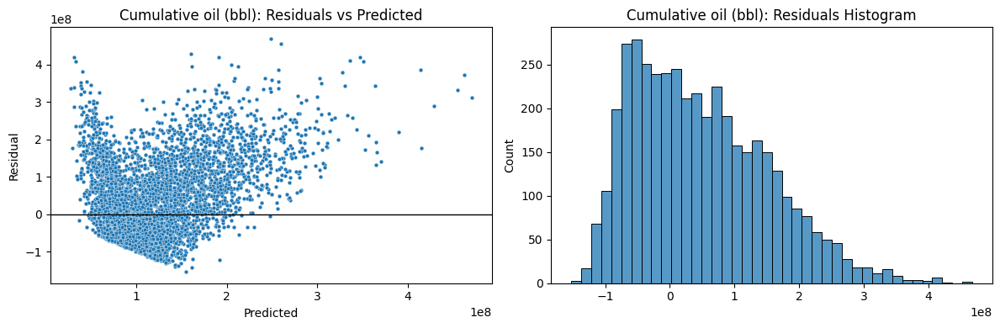


Top coefficients (Oil model, log-target):
THICKNESS (ft)       0.363949
PERM (md)            0.361591
BHP (psi)           -0.352222
INJRATE (ft3/day)    0.297542
AREA (ft2)           0.221939
Sorg                -0.122053
POROSITY             0.078359
DEPTH (ft)          -0.010298
Sorw                -0.008124
dtype: float64


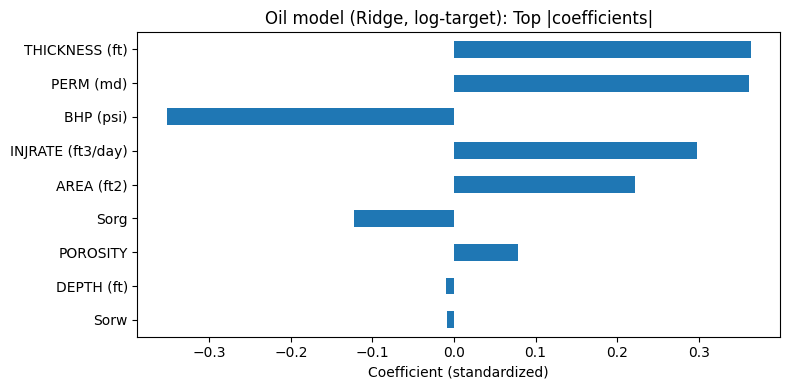

In [ ]:
# === CUMULATIVE OIL ONLY (RidgeCV + log-target) ===
import warnings; warnings.filterwarnings("ignore")

import io, numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from google.colab import files

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# ---------- 0) Upload & load (use first 11 columns: A–K) ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(io.BytesIO(uploaded[fname])).iloc[:, 0:11]

# Inputs (A–I) and Target (K)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 10].copy()  # Cumulative oil (bbl)

print("Columns:", df.columns.tolist())

# ---------- 1) Custom skew transformer ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include if include is not None else []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        skew = Xdf.skew(numeric_only=True)
        auto = skew[skew.abs() > self.skew_threshold].index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

# Preprocessing: log1p for skew (force AREA) + RobustScaler
feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(skew_threshold=1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- 2) Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ---------- 3) Model (log-target helps for right-skew) ----------
alphas = np.logspace(-3, 3, 25)
ridge = RidgeCV(alphas=alphas, cv=5)
pipe = TransformedTargetRegressor(
    regressor=Pipeline([("prep", preprocessor), ("reg", ridge)]),
    func=np.log1p, inverse_func=np.expm1
)

# ---------- 4) Fit ----------
pipe.fit(X_train, y_train)

# IMPORTANT: after fitting a TransformedTargetRegressor,
# the fitted inner pipeline lives at .regressor_ (with underscore)
log_step = pipe.regressor_.named_steps["prep"].named_transformers_["num"].named_steps["log_skew"]
print("Input columns log1p-transformed:", log_step.to_log_)

# ---------- 5) Evaluate ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float).ravel()
    y_pred = np.asarray(y_pred, dtype=float).ravel()
    r2  = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100.0
    return {"R2": r2, "MAE": mae, "RMSE": rmse, "MAPE_%": mape}

y_pred = pipe.predict(X_test)
print("\n=== Test Metrics (Cumulative oil) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

def cv_summary(pipe, X_tr, y_tr):
    r2 = cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="r2").mean()
    rmse = (-cross_val_score(pipe, X_tr, y_tr, cv=5, scoring="neg_root_mean_squared_error")).mean()
    print(f"5-fold CV on TRAIN -> R²={r2:.3f}, RMSE={rmse:.3f}")
cv_summary(pipe, X_train, y_train)

# ---------- 6) Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0])
    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted")
    ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")

    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1])
    ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "Cumulative oil (bbl)")

# ---------- 7) Coefficients (standardized) ----------
inner = pipe.regressor_  # fitted inner Pipeline
coefs = inner.named_steps["reg"].coef_
coef_series = pd.Series(coefs, index=X.columns).sort_values(key=np.abs, ascending=False)
print("\nTop coefficients (Oil model, log-target):")
print(coef_series.head(10))

plt.figure(figsize=(8,4))
coef_series.head(10).iloc[::-1].plot(kind="barh")
plt.title("Oil model (Ridge, log-target): Top |coefficients|")
plt.xlabel("Coefficient (standardized)")
plt.tight_layout(); plt.show()


Saving CO2 Dataset.csv to CO2 Dataset (1).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best RF params (CO2): {'reg__n_estimators': 800, 'reg__min_samples_split': 5, 'reg__min_samples_leaf': 2, 'reg__max_features': 0.6, 'reg__max_depth': 40}

=== Test Metrics (CO2 | RF tuned) ===
         R2            MAE          RMSE     MAPE_%
0  0.989224  918981.892879  1.171670e+06  23.984449
Train 5-fold CV: R²=0.989, RMSE=1187629.755


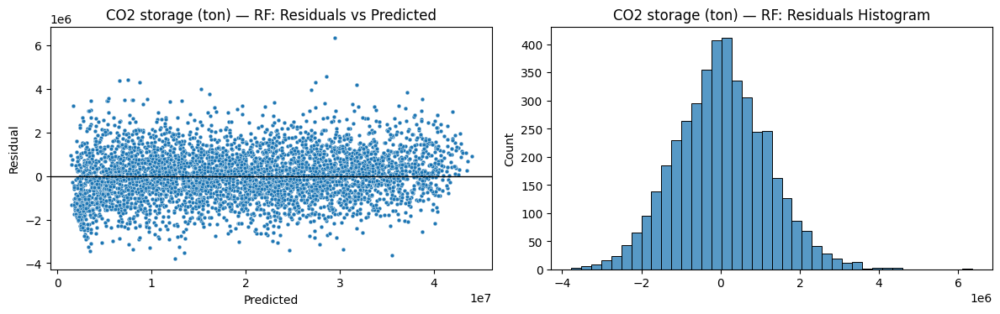

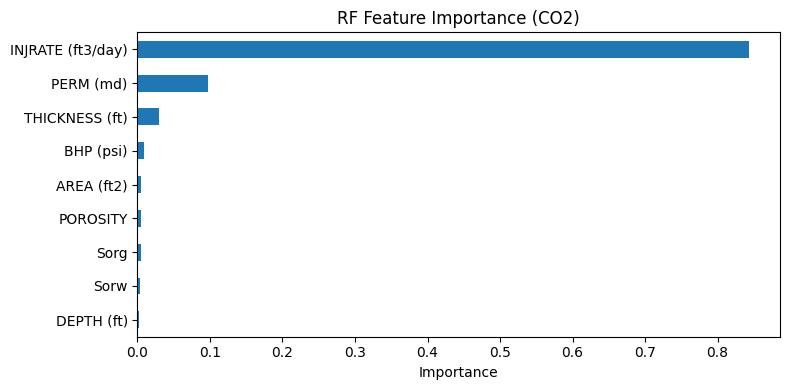

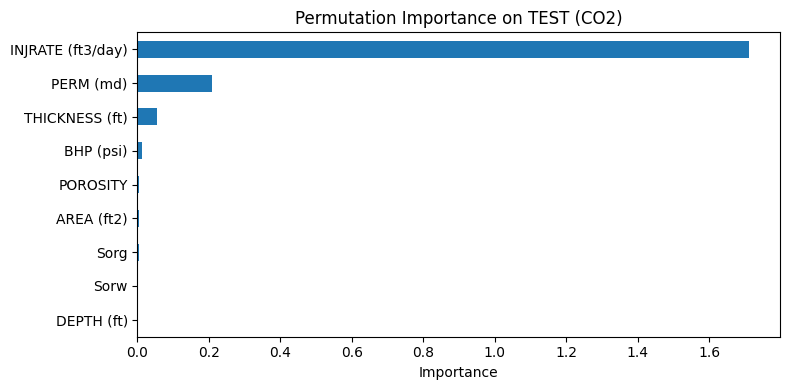

,0
INJRATE (ft3/day),1.712510
PERM (md),0.208337
THICKNESS (ft),0.054529
BHP (psi),0.012490
POROSITY,0.005595
AREA (ft2),0.005398
Sorg,0.003529
Sorw,0.001871
DEPTH (ft),-0.000009


In [ ]:
# === CO2 STORAGE ONLY — RANDOM FOREST (tuned) ===
# === CO2 STORAGE ONLY — RANDOM FOREST (tuned) ===
import warnings; warnings.filterwarnings("ignore")

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (J)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 9].copy()   # CO2 storage (ton)

# ---------- Preprocessing: log1p on skew (force AREA), RobustScaler optional ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())   # not required for trees; kept for consistency
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- RF + hyperparameter search ----------
rf = RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=-1, bootstrap=True)

param_dist = {
    "reg__n_estimators": [400, 600, 800],
    "reg__max_depth": [None, 10, 20, 30, 40],
    "reg__min_samples_split": [2, 5, 10],
    "reg__min_samples_leaf": [1, 2, 4],
    "reg__max_features": ["sqrt", "log2", 1.0, 0.8, 0.6]  # 'auto' is deprecated
}

pipe = Pipeline([("prep", preprocessor), ("reg", rf)])

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=20, cv=5, scoring="r2",
    random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

# ---------- Fit ----------
search.fit(X_train, y_train)
print("Best RF params (CO2):", search.best_params_)

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = search.predict(X_test)
print("\n=== Test Metrics (CO2 | RF tuned) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train with the tuned model
r2_cv = cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "CO2 storage (ton) — RF")

# ---------- Feature importance ----------
def plot_feature_importance(importances, feature_names, title, top_n=12):
    s = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8,4)); s.iloc[::-1].plot(kind="barh")
    plt.title(title); plt.xlabel("Importance"); plt.tight_layout(); plt.show()
    return s

rf_best = search.best_estimator_.named_steps["reg"]
plot_feature_importance(rf_best.feature_importances_, X.columns, "RF Feature Importance (CO2)")

perm = permutation_importance(search.best_estimator_, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm.importances_mean, X.columns, "Permutation Importance on TEST (CO2)")


Saving CO2 Dataset.csv to CO2 Dataset (2).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best RF params (Oil): {'reg__n_estimators': 800, 'reg__min_samples_split': 5, 'reg__min_samples_leaf': 2, 'reg__max_features': 0.6, 'reg__max_depth': 40}

=== Test Metrics (Oil | RF tuned, log-target) ===
         R2           MAE          RMSE      MAPE_%
0  0.651472  5.955533e+07  7.862057e+07  297.914071
Train 5-fold CV: R²=0.648, RMSE=78714311.921


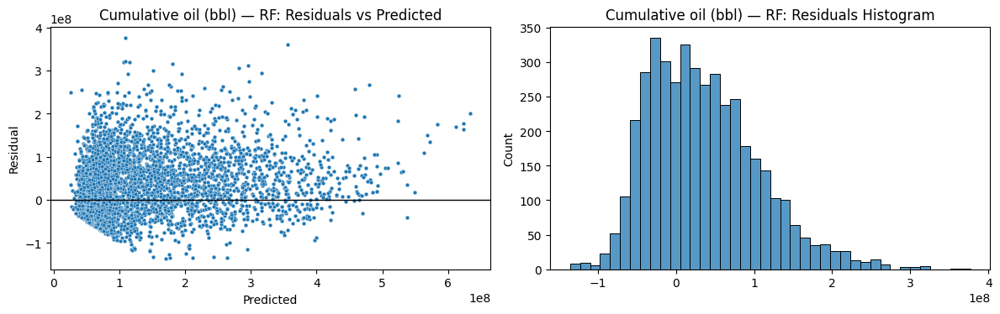

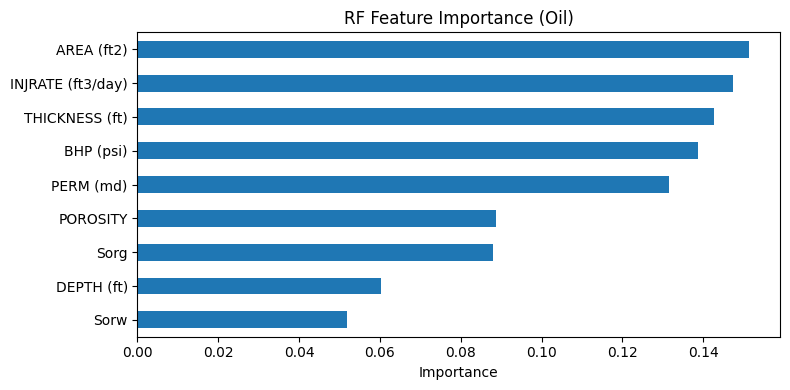

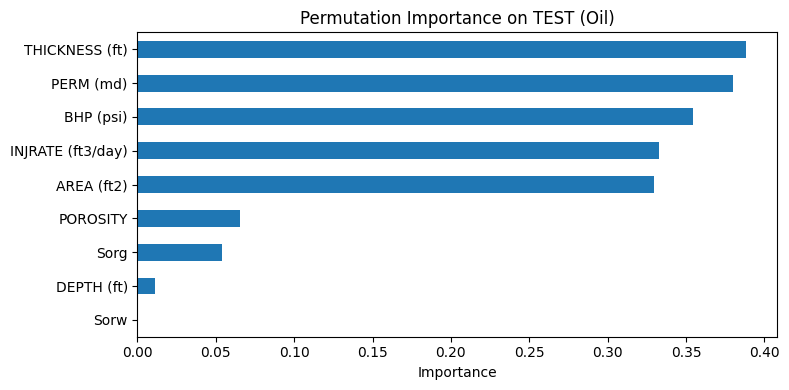

,0
THICKNESS (ft),0.388504
PERM (md),0.380089
BHP (psi),0.354711
INJRATE (ft3/day),0.332528
AREA (ft2),0.329430
POROSITY,0.065303
Sorg,0.054137
DEPTH (ft),0.010874
Sorw,0.000473


In [ ]:
# === CUMULATIVE OIL ONLY — RANDOM FOREST (tuned, log-target) ===
import warnings; warnings.filterwarnings("ignore")

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (K)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 10].copy()  # Cumulative oil (bbl)

# ---------- Preprocessing ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())   # optional for trees
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- RF + hyperparameter search ----------
rf = RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=-1, bootstrap=True)

param_dist = {
    "reg__n_estimators": [400, 600, 800],
    "reg__max_depth": [None, 10, 20, 30, 40],
    "reg__min_samples_split": [2, 5, 10],
    "reg__min_samples_leaf": [1, 2, 4],
    "reg__max_features": ["sqrt", "log2", 1.0, 0.8, 0.6]
}

inner_search = RandomizedSearchCV(
    estimator=Pipeline([("prep", preprocessor), ("reg", rf)]),
    param_distributions=param_dist,
    n_iter=20, cv=5, scoring="r2",
    random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

# Wrap in TTR to log-transform the target
pipe = TransformedTargetRegressor(
    regressor=inner_search,
    func=np.log1p, inverse_func=np.expm1
)

# ---------- Fit ----------
pipe.fit(X_train, y_train)

# Access the FITTED search & fitted RF (note the underscores)
print("Best RF params (Oil):", pipe.regressor_.best_params_)
rf_best = pipe.regressor_.best_estimator_.named_steps["reg"]

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = pipe.predict(X_test)
print("\n=== Test Metrics (Oil | RF tuned, log-target) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train (wrapper)
r2_cv = cross_val_score(pipe, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(pipe, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "Cumulative oil (bbl) — RF")

# ---------- Feature importance ----------
def plot_feature_importance(importances, feature_names, title, top_n=12):
    s = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8,4)); s.iloc[::-1].plot(kind="barh")
    plt.title(title); plt.xlabel("Importance"); plt.tight_layout(); plt.show()
    return s

plot_feature_importance(rf_best.feature_importances_, X.columns, "RF Feature Importance (Oil)")

# Permutation importance with the WRAPPED model
perm = permutation_importance(pipe, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm.importances_mean, X.columns, "Permutation Importance on TEST (Oil)")


Saving CO2 Dataset.csv to CO2 Dataset.csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best XGB params (CO2): {'reg__subsample': 1.0, 'reg__reg_lambda': 1.0, 'reg__reg_alpha': 0.1, 'reg__n_estimators': 1200, 'reg__min_child_weight': 10, 'reg__max_depth': 5, 'reg__learning_rate': 0.05, 'reg__gamma': 0.2, 'reg__colsample_bytree': 1.0}

=== Test Metrics (CO2 | XGBoost tuned) ===
         R2            MAE           RMSE     MAPE_%
0  0.995821  547948.930364  729623.018932  17.107772
Train 5-fold CV: R²=0.996, RMSE=754512.786


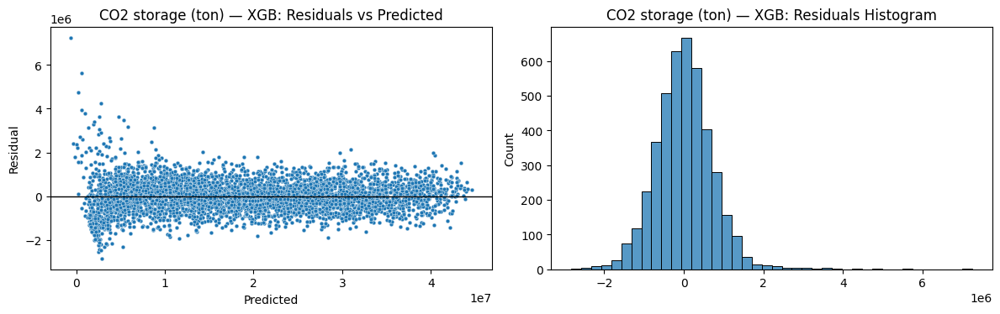

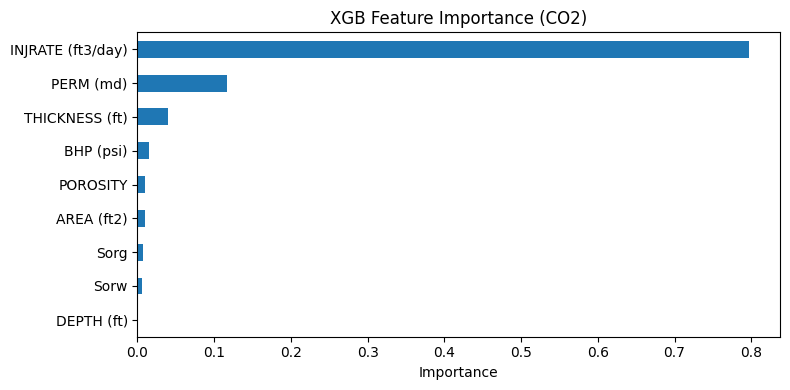

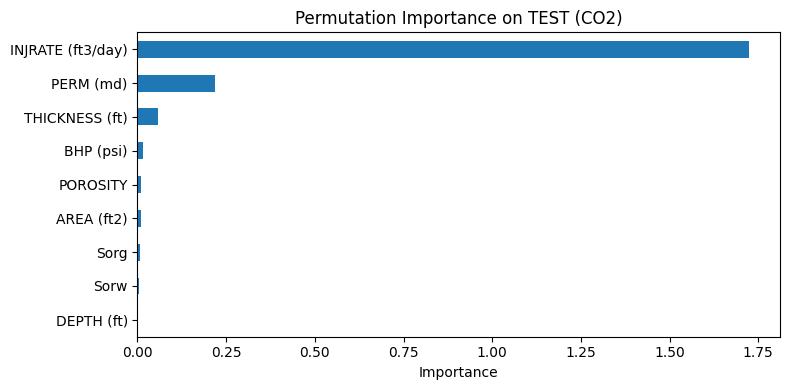

,0
INJRATE (ft3/day),1.724960
PERM (md),0.217930
THICKNESS (ft),0.059142
BHP (psi),0.015873
POROSITY,0.009309
AREA (ft2),0.008966
Sorg,0.006846
Sorw,0.004245
DEPTH (ft),-0.000007


In [ ]:
# === CO2 STORAGE ONLY — XGBoost (tuned) ===
!pip -q install xgboost

import warnings; warnings.filterwarnings("ignore")
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files
from xgboost import XGBRegressor

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (J)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 9].copy()  # CO2 storage (ton)

# ---------- Preprocessing ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())  # optional for trees
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- XGBoost + hyperparameter search ----------
xgb = XGBRegressor(
    objective="reg:squarederror",
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=-1
)

param_dist = {
    "reg__n_estimators": [300, 600, 900, 1200],
    "reg__learning_rate": [0.01, 0.03, 0.05, 0.1],
    "reg__max_depth": [3, 4, 5, 6, 8, 10],
    "reg__min_child_weight": [1, 2, 5, 10],
    "reg__subsample": [0.6, 0.8, 1.0],
    "reg__colsample_bytree": [0.6, 0.8, 1.0],
    "reg__gamma": [0, 0.1, 0.2, 0.4],
    "reg__reg_alpha": [0, 0.01, 0.1, 1.0],
    "reg__reg_lambda": [0.5, 1.0, 2.0]
}

pipe = Pipeline([("prep", preprocessor), ("reg", xgb)])

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=30, cv=5, scoring="r2",
    random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

# ---------- Fit ----------
search.fit(X_train, y_train)
print("Best XGB params (CO2):", search.best_params_)

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = search.predict(X_test)
print("\n=== Test Metrics (CO2 | XGBoost tuned) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train (tuned model)
r2_cv = cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "CO2 storage (ton) — XGB")

# ---------- Feature importance ----------
def plot_feature_importance(importances, feature_names, title, top_n=12):
    s = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8,4)); s.iloc[::-1].plot(kind="barh")
    plt.title(title); plt.xlabel("Importance"); plt.tight_layout(); plt.show()
    return s

xgb_best = search.best_estimator_.named_steps["reg"]
plot_feature_importance(xgb_best.feature_importances_, X.columns, "XGB Feature Importance (CO2)")

perm = permutation_importance(search.best_estimator_, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm.importances_mean, X.columns, "Permutation Importance on TEST (CO2)")


Saving CO2 Dataset.csv to CO2 Dataset (1).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best XGB params (Oil): {'reg__subsample': 0.6, 'reg__reg_lambda': 0.5, 'reg__reg_alpha': 0, 'reg__n_estimators': 300, 'reg__min_child_weight': 10, 'reg__max_depth': 8, 'reg__learning_rate': 0.03, 'reg__gamma': 0.1, 'reg__colsample_bytree': 1.0}

=== Test Metrics (Oil | XGBoost tuned, log-target) ===
         R2           MAE          RMSE      MAPE_%
0  0.690034  5.597911e+07  7.414370e+07  285.464469
Train 5-fold CV: R²=0.683, RMSE=74668427.870


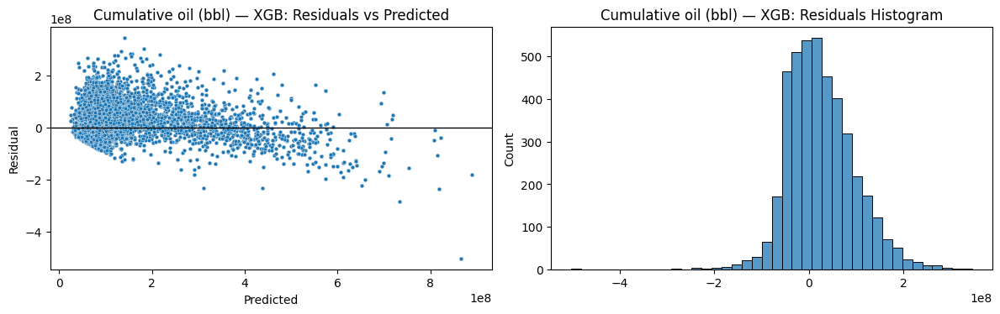

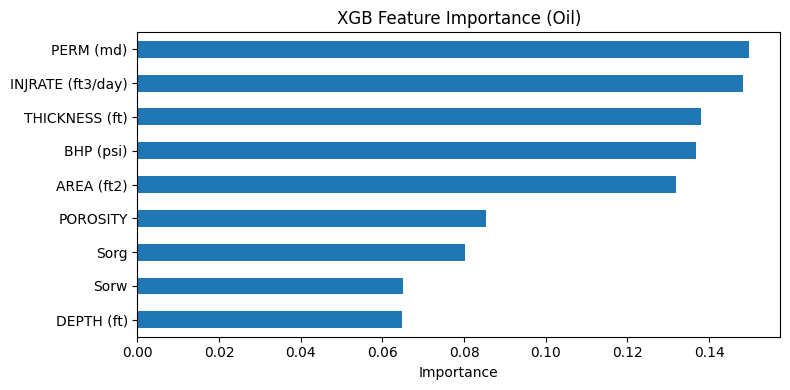

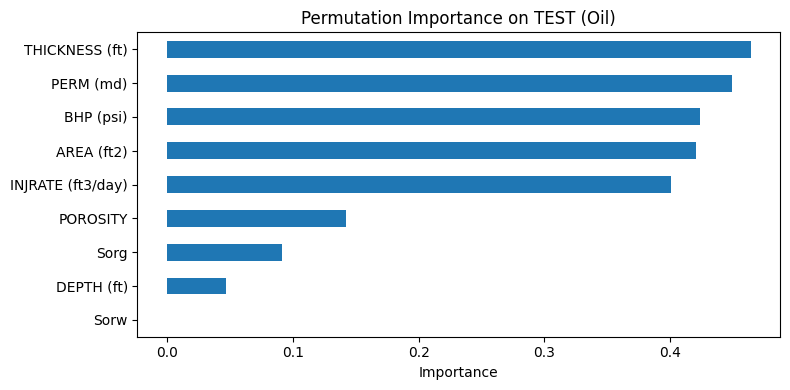

,0
THICKNESS (ft),0.464163
PERM (md),0.449406
BHP (psi),0.423760
AREA (ft2),0.420206
INJRATE (ft3/day),0.400350
POROSITY,0.142452
Sorg,0.091200
DEPTH (ft),0.046631
Sorw,-0.000442


In [ ]:
# === CUMULATIVE OIL ONLY — XGBoost (tuned, log-target) ===
!pip -q install xgboost

import warnings; warnings.filterwarnings("ignore")
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files
from xgboost import XGBRegressor

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (K)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 10].copy()  # Cumulative oil (bbl)

# ---------- Preprocessing ----------
class SkewLog1pTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())  # optional
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- XGBoost + hyperparameter search ----------
xgb = XGBRegressor(
    objective="reg:squarederror",
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=-1
)

param_dist = {
    "reg__n_estimators": [300, 600, 900, 1200],
    "reg__learning_rate": [0.01, 0.03, 0.05, 0.1],
    "reg__max_depth": [3, 4, 5, 6, 8, 10],
    "reg__min_child_weight": [1, 2, 5, 10],
    "reg__subsample": [0.6, 0.8, 1.0],
    "reg__colsample_bytree": [0.6, 0.8, 1.0],
    "reg__gamma": [0, 0.1, 0.2, 0.4],
    "reg__reg_alpha": [0, 0.01, 0.1, 1.0],
    "reg__reg_lambda": [0.5, 1.0, 2.0]
}

inner_search = RandomizedSearchCV(
    estimator=Pipeline([("prep", preprocessor), ("reg", xgb)]),
    param_distributions=param_dist,
    n_iter=30, cv=5, scoring="r2",
    random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

# Wrap in TTR to log-transform the target
pipe = TransformedTargetRegressor(
    regressor=inner_search,
    func=np.log1p,
    inverse_func=np.expm1
)

# ---------- Fit ----------
pipe.fit(X_train, y_train)

# Access the FITTED search & RF
print("Best XGB params (Oil):", pipe.regressor_.best_params_)
xgb_best = pipe.regressor_.best_estimator_.named_steps["reg"]

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = pipe.predict(X_test)
print("\n=== Test Metrics (Oil | XGBoost tuned, log-target) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train (wrapper)
r2_cv = cross_val_score(pipe, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(pipe, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "Cumulative oil (bbl) — XGB")

# ---------- Feature importance ----------
def plot_feature_importance(importances, feature_names, title, top_n=12):
    s = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(8,4)); s.iloc[::-1].plot(kind="barh")
    plt.title(title); plt.xlabel("Importance"); plt.tight_layout(); plt.show()
    return s

plot_feature_importance(xgb_best.feature_importances_, X.columns, "XGB Feature Importance (Oil)")

# Permutation importance with the WRAPPED model
perm = permutation_importance(pipe, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
plot_feature_importance(perm.importances_mean, X.columns, "Permutation Importance on TEST (Oil)")


Saving CO2 Dataset.csv to CO2 Dataset (2).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best MELM params (Oil): {'reg__n_hidden': 1024, 'reg__fit_intercept': False, 'reg__alpha': 1.0, 'reg__activation': 'sigmoid'}

=== Test Metrics (Oil | MELM tuned, log-target) ===
         R2           MAE          RMSE      MAPE_%
0  0.358301  6.899096e+07  1.066800e+08  294.636525
Train 5-fold CV: R²=0.315, RMSE=109724134.593


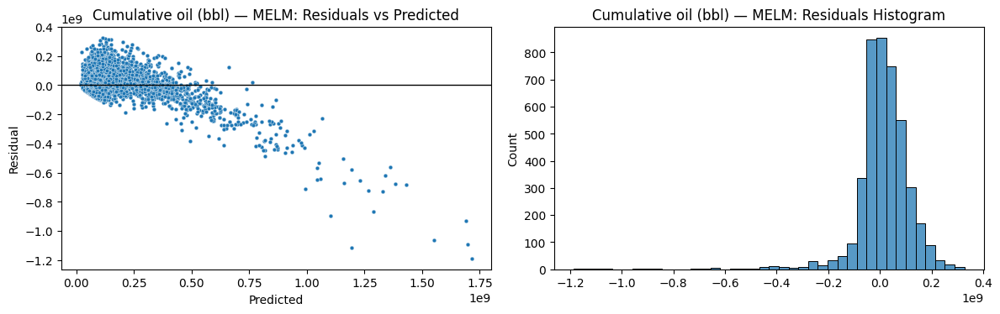

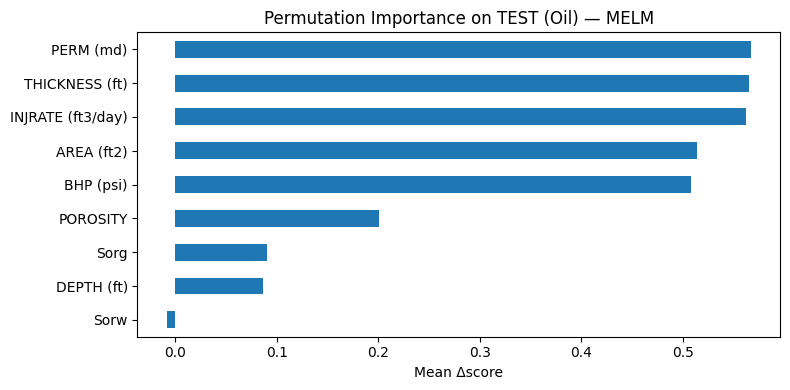

In [ ]:
# === CUMULATIVE OIL ONLY — MELM (tuned, log-target) ===
import warnings; warnings.filterwarnings("ignore")

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files

from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (K)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 10].copy()  # Cumulative oil (bbl)

# ---------- Preprocessing ----------
class SkewLog1pTransformer(BaseEstimator):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []
    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include))); return self
    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- MELM Regressor ----------
class MELMRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, n_hidden=256, activation="tanh", alpha=1e-2, fit_intercept=True, random_state=None):
        self.n_hidden=n_hidden; self.activation=activation; self.alpha=alpha
        self.fit_intercept=fit_intercept; self.random_state=random_state
    def _act(self, Z):
        if self.activation=="tanh": return np.tanh(Z)
        if self.activation=="relu": return np.maximum(0.0, Z)
        if self.activation=="sigmoid": return 1.0/(1.0+np.exp(-Z))
        return Z
    def fit(self, X, y):
        X=np.asarray(X,float); y=np.asarray(y,float).ravel()
        rng=np.random.RandomState(self.random_state); n_features=X.shape[1]
        self.W_=rng.normal(0,1,(n_features,self.n_hidden)); self.b_=rng.normal(0,1,(self.n_hidden,))
        H=self._act(X@self.W_+self.b_);
        if self.fit_intercept: H=np.hstack([H, np.ones((H.shape[0],1))])
        I=np.eye(H.shape[1]); self.beta_=np.linalg.solve(H.T@H+self.alpha*I, H.T@y);
        return self
    def predict(self, X):
        X=np.asarray(X,float); H=self._act(X@self.W_+self.b_)
        if self.fit_intercept: H=np.hstack([H, np.ones((H.shape[0],1))])
        return H@self.beta_

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- Tuning (inside TTR for log-target) ----------
inner_pipe = Pipeline([
    ("prep", preprocessor),
    ("reg", MELMRegressor(random_state=RANDOM_STATE))
])

param_dist = {
    "reg__n_hidden": [64, 128, 256, 512, 1024],
    "reg__activation": ["tanh", "relu", "sigmoid", "linear"],
    "reg__alpha": [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.0],
    "reg__fit_intercept": [True, False],
}

search = RandomizedSearchCV(
    inner_pipe, param_distributions=param_dist, n_iter=30, cv=5,
    scoring="r2", random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

pipe = TransformedTargetRegressor(
    regressor=search,
    func=np.log1p, inverse_func=np.expm1
)

# ---------- Fit ----------
pipe.fit(X_train, y_train)
print("Best MELM params (Oil):", pipe.regressor_.best_params_)

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = pipe.predict(X_test)
print("\n=== Test Metrics (Oil | MELM tuned, log-target) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train (wrapper)
r2_cv = cross_val_score(pipe, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(pipe, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "Cumulative oil (bbl) — MELM")

# ---------- Permutation importance ----------
perm = permutation_importance(pipe, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
imp = pd.Series(perm.importances_mean, index=X.columns).sort_values(ascending=False).head(12)
plt.figure(figsize=(8,4)); imp.iloc[::-1].plot(kind="barh")
plt.title("Permutation Importance on TEST (Oil) — MELM"); plt.xlabel("Mean Δscore"); plt.tight_layout(); plt.show()


Saving CO2 Dataset.csv to CO2 Dataset (3).csv
Columns: ['BHP (psi)', 'AREA (ft2)', 'INJRATE (ft3/day)', 'POROSITY', 'PERM (md)', 'THICKNESS (ft)', 'DEPTH (ft)', 'Sorg', 'Sorw', 'CO2 storage (ton)', 'Cummulative oil production (bbl)']
Best MELM params (CO2): {'reg__n_hidden': 1024, 'reg__fit_intercept': True, 'reg__alpha': 1e-05, 'reg__activation': 'sigmoid'}

=== Test Metrics (CO2 | MELM tuned) ===
         R2            MAE          RMSE     MAPE_%
0  0.990951  792713.476332  1.073703e+06  23.150022
Train 5-fold CV: R²=0.991, RMSE=1095108.635


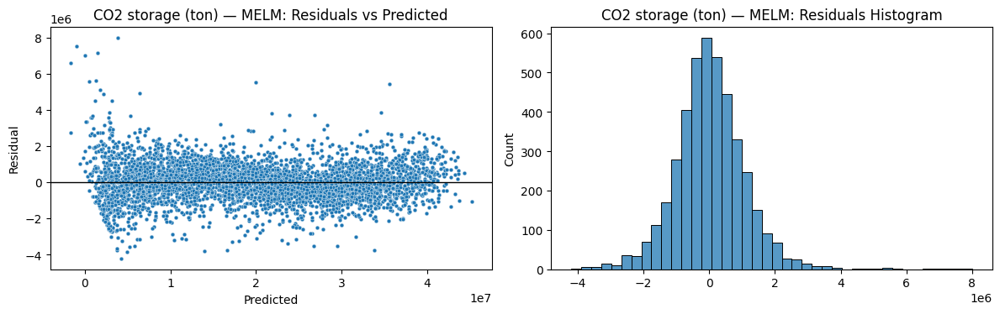

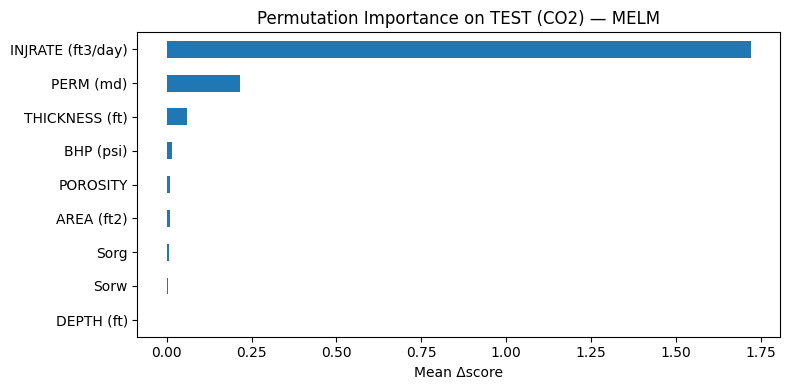

In [ ]:
# === CO2 STORAGE ONLY — MELM (tuned) ===
import warnings; warnings.filterwarnings("ignore")

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from io import BytesIO
from google.colab import files

from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.inspection import permutation_importance

RANDOM_STATE = 42

# ---------- Upload & load A–K ----------
uploaded = files.upload()
fname = next(iter(uploaded))
df = pd.read_csv(BytesIO(uploaded[fname])).iloc[:, 0:11]
print("Columns:", df.columns.tolist())

# Inputs (A–I) and target (J)
X = df.iloc[:, 0:9].copy()
y = df.iloc[:, 9].copy()  # CO2 storage (ton)

# ---------- Preprocessing ----------
class SkewLog1pTransformer(BaseEstimator):
    def __init__(self, skew_threshold=1.0, include=None, clip_min=0.0):
        self.skew_threshold = skew_threshold
        self.include = include or []
        self.clip_min = clip_min
        self.to_log_ = []

    def fit(self, X, y=None):
        Xdf = pd.DataFrame(X).copy()
        auto = Xdf.skew(numeric_only=True).abs().gt(self.skew_threshold).index.tolist()
        self.to_log_ = sorted(set(auto + list(self.include)))
        return self

    def transform(self, X):
        Xdf = pd.DataFrame(X).copy()
        for c in self.to_log_:
            Xdf[c] = np.log1p(np.clip(Xdf[c], self.clip_min, None))
        return Xdf.values

feature_preprocess = Pipeline([
    ("log_skew", SkewLog1pTransformer(1.0, include=["AREA (ft2)"])),
    ("scale", RobustScaler())
])
preprocessor = ColumnTransformer([("num", feature_preprocess, X.columns)], remainder="drop")

# ---------- MELM Regressor (single-hidden-layer ELM + ridge) ----------
class MELMRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, n_hidden=256, activation="tanh", alpha=1e-2, fit_intercept=True, random_state=None):
        self.n_hidden = n_hidden
        self.activation = activation
        self.alpha = alpha
        self.fit_intercept = fit_intercept
        self.random_state = random_state

    def _act(self, Z):
        if self.activation == "tanh": return np.tanh(Z)
        if self.activation == "relu": return np.maximum(0.0, Z)
        if self.activation == "sigmoid": return 1.0/(1.0+np.exp(-Z))
        return Z  # linear

    def fit(self, X, y):
        X = np.asarray(X, float); y = np.asarray(y, float).ravel()
        rng = np.random.RandomState(self.random_state)
        n_features = X.shape[1]

        self.W_ = rng.normal(0, 1, size=(n_features, self.n_hidden))
        self.b_ = rng.normal(0, 1, size=(self.n_hidden,))
        H = self._act(X @ self.W_ + self.b_)
        if self.fit_intercept:
            H = np.hstack([H, np.ones((H.shape[0], 1))])
        # Ridge closed-form: beta = (H^T H + alpha I)^(-1) H^T y
        I = np.eye(H.shape[1])
        self.beta_ = np.linalg.solve(H.T @ H + self.alpha * I, H.T @ y)
        return self

    def predict(self, X):
        X = np.asarray(X, float)
        H = self._act(X @ self.W_ + self.b_)
        if self.fit_intercept:
            H = np.hstack([H, np.ones((H.shape[0], 1))])
        return H @ self.beta_

# ---------- Split ----------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

# ---------- Tuning ----------
pipe = Pipeline([
    ("prep", preprocessor),
    ("reg", MELMRegressor(random_state=RANDOM_STATE))
])

param_dist = {
    "reg__n_hidden": [64, 128, 256, 512, 1024],
    "reg__activation": ["tanh", "relu", "sigmoid", "linear"],
    "reg__alpha": [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.0],
    "reg__fit_intercept": [True, False],
}

search = RandomizedSearchCV(
    pipe, param_distributions=param_dist, n_iter=30, cv=5,
    scoring="r2", random_state=RANDOM_STATE, n_jobs=-1, verbose=0
)

# ---------- Fit ----------
search.fit(X_train, y_train)
print("Best MELM params (CO2):", search.best_params_)

# ---------- Metrics ----------
def metrics_report(y_true, y_pred):
    y_true = np.asarray(y_true, float).ravel()
    y_pred = np.asarray(y_pred, float).ravel()
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAPE_%": mean_absolute_percentage_error(y_true, np.maximum(y_pred, 1e-12)) * 100
    }

y_pred = search.predict(X_test)
print("\n=== Test Metrics (CO2 | MELM tuned) ===")
print(pd.DataFrame([metrics_report(y_test, y_pred)]))

# CV on train with tuned model
r2_cv = cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="r2", n_jobs=-1).mean()
rmse_cv = (-cross_val_score(search.best_estimator_, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1)).mean()
print(f"Train 5-fold CV: R²={r2_cv:.3f}, RMSE={rmse_cv:.3f}")

# ---------- Residuals ----------
def residual_plots(y_true, y_pred, title):
    resid = y_true - y_pred
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    sns.scatterplot(x=y_pred, y=resid, s=12, ax=ax[0]); ax[0].axhline(0, color="k", lw=1)
    ax[0].set_title(f"{title}: Residuals vs Predicted"); ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("Residual")
    sns.histplot(resid, bins=40, edgecolor="black", ax=ax[1]); ax[1].set_title(f"{title}: Residuals Histogram")
    plt.tight_layout(); plt.show()

residual_plots(y_test.values, y_pred, "CO2 storage (ton) — MELM")

# ---------- Permutation importance (feature effects) ----------
perm = permutation_importance(search.best_estimator_, X_test, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
imp = pd.Series(perm.importances_mean, index=X.columns).sort_values(ascending=False).head(12)
plt.figure(figsize=(8,4)); imp.iloc[::-1].plot(kind="barh")
plt.title("Permutation Importance on TEST (CO2) — MELM"); plt.xlabel("Mean Δscore"); plt.tight_layout(); plt.show()
